## ICA SUJETO 2900

En este Notebook se realizan los siguientes pasos:

1. Separación de la señal en crudo: 6 spots + un tramo de actividad basal
2. Filtrado de cada tramo (BPF 1-40 Hz + Notch 50 hZ)
3. ICA 
4. Índice neurométrico AW
5. Fichero csv con los valores del AWI

IMPORT MODULES

In [38]:
import mne
from TFG_utils import (returnFiles, take_vmrk_files, take_vhdr_files, take_eeg_files, plot_freq_response, plot_PSD, 
                       plot_eeg_channel_corrected, plot_residual_PSD, plot_spots, Get_Start_End_mrk, 
                       Get_spot_start_samples, filtering_track, get_potencias)
import matplotlib.pyplot as plt
from scipy import signal
import numpy as np
import csv
from sklearn.decomposition import PCA
import pandas as pd
print('MNE version:',mne.__version__)

MNE version: 0.20.7


In [2]:
#%matplotlib qt
%matplotlib notebook
verbose=False

COLLECTING DATA

In [3]:
foldername = 'EEG_folders'
EEG_files= returnFiles(foldername)

vmrk_files= take_vmrk_files(EEG_files)
vhdr_files= take_vhdr_files(EEG_files)
eeg_files= take_eeg_files(EEG_files)

i= 3 # Choosing EEG recording to use
vmrk_filename= vmrk_files[i]
vhdr_filename= vhdr_files[i]
eeg_filename= eeg_files[i]

raw_eeg = mne.io.read_raw_brainvision(vhdr_files[i],verbose=verbose).load_data(verbose=verbose)
data,times= raw_eeg[:]
info= raw_eeg.info
fs= int(info['sfreq'])

#Selecting channel to represent:
ch = 2 #Channel F3
#ch = 28 #Channel F4
#ch = 3 #Channel F7
#ch = 29 #Channel F8

subject= eeg_filename[-8:-4]
print('Sujeto:',subject)
print('Canal:', info['ch_names'][ch])

n_chan=31

Sujeto: 2900
Canal: F3


### SEPARATE SPOTS

In [4]:
spots_times_sec = [0, 60, 120, 180, 226, 287, 347] # Time (sec) at which each spot begins
ini= int(60)*int(fs) #samples of 1st min of basal activity
start_end=Get_Start_End_mrk(vmrk_files[i]) # markers of the spots: start and end
spots_time=Get_spot_start_samples(start_end,fs, spots_times_sec) # Time (samples) at which each spot begins

In [5]:
ba=[]
sp1=[]
sp2=[]
sp3=[]
sp4=[]
sp5=[]
sp6=[]

for ch in range(len(info['ch_names'])):
    ba.append(data[ch,spots_time[0]:spots_time[1]]) #1st spot
    sp1.append(data[ch,spots_time[1]:spots_time[2]]) #2nd spot
    sp2.append(data[ch,spots_time[2]:spots_time[3]]) #3rd spot
    sp3.append(data[ch,spots_time[3]:spots_time[4]]) #4th spot
    sp4.append(data[ch,spots_time[4]:spots_time[5]]) #5th spot
    sp5.append(data[ch,spots_time[5]:spots_time[6]]) #6th spot
    sp6.append(data[ch,spots_time[6]:]) #7th spot

ba  = mne.io.RawArray(ba, info,verbose=verbose).set_montage("standard_1020", verbose= verbose)
sp1 = mne.io.RawArray(sp1, info,verbose=verbose).set_montage("standard_1020", verbose= verbose)
sp2 = mne.io.RawArray(sp2, info,verbose=verbose).set_montage("standard_1020", verbose= verbose)
sp3 = mne.io.RawArray(sp3, info,verbose=verbose).set_montage("standard_1020", verbose= verbose)
sp4 = mne.io.RawArray(sp4, info,verbose=verbose).set_montage("standard_1020", verbose= verbose)
sp5 = mne.io.RawArray(sp5, info,verbose=verbose).set_montage("standard_1020", verbose= verbose)
sp6 = mne.io.RawArray(sp6, info,verbose=verbose).set_montage("standard_1020", verbose= verbose)

<IPython.core.display.Javascript object>


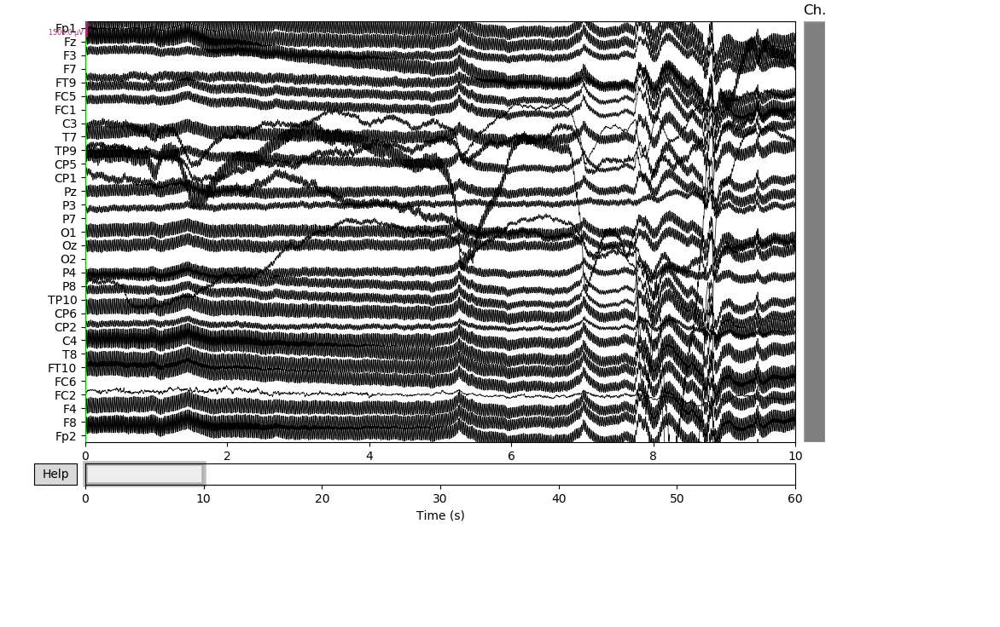

In [6]:
ba.plot(scalings={"eeg": 75e-5},n_channels=n_chan)
plt.show()

### FILTERING

In [7]:
ba_filt=filtering_track(ba)
sp1_filt=filtering_track(sp1)
sp2_filt=filtering_track(sp2)
sp3_filt=filtering_track(sp3)
sp4_filt=filtering_track(sp4)
sp5_filt=filtering_track(sp5)
sp6_filt=filtering_track(sp6)

<IPython.core.display.Javascript object>


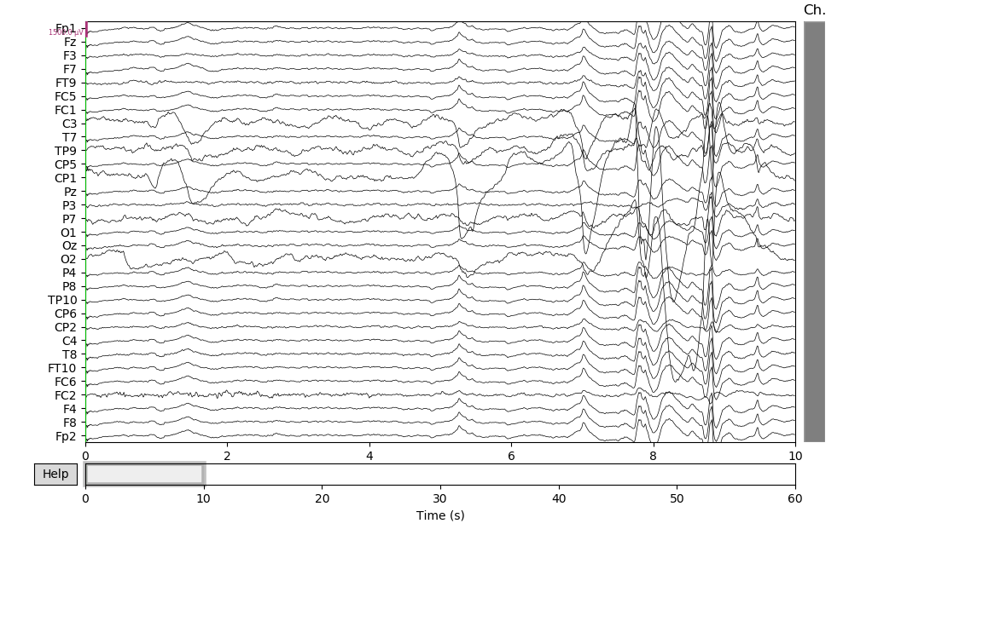

In [8]:
ba_filt.plot(scalings={"eeg": 75e-5},n_channels=n_chan)
plt.show()

### ICA

In [9]:
n_components=15
n=10

Basal Activity

Fitting ICA to data using 31 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting all PCA components: 31 components
Fitting ICA took 9.8s.


<IPython.core.display.Javascript object>


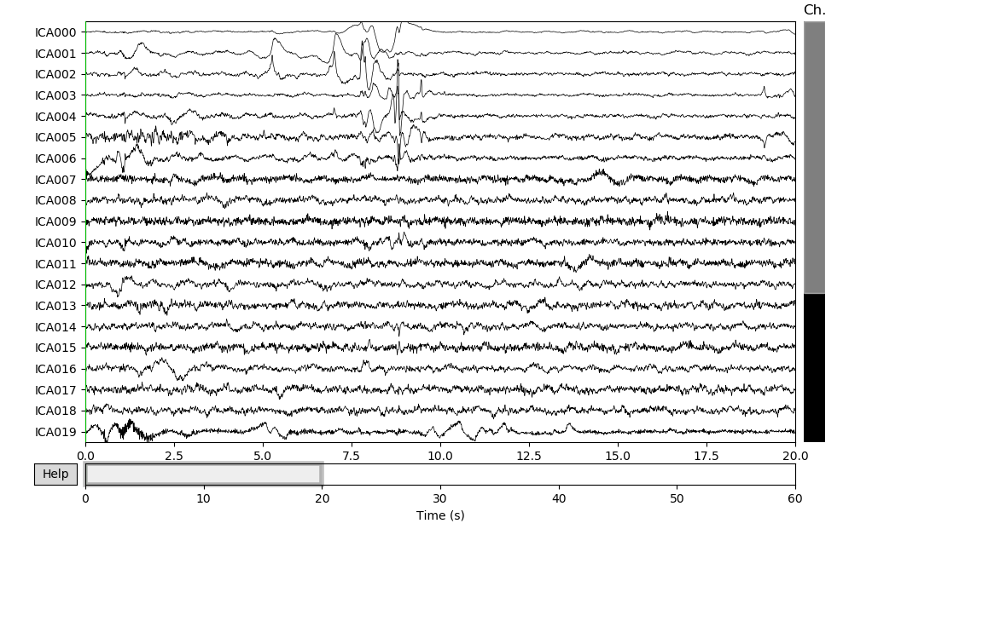

In [10]:
ba_ica = mne.preprocessing.ICA(method='picard', random_state=1, verbose=True).fit(ba_filt)
ba_ica.plot_sources(ba_filt)
plt.show()

<IPython.core.display.Javascript object>


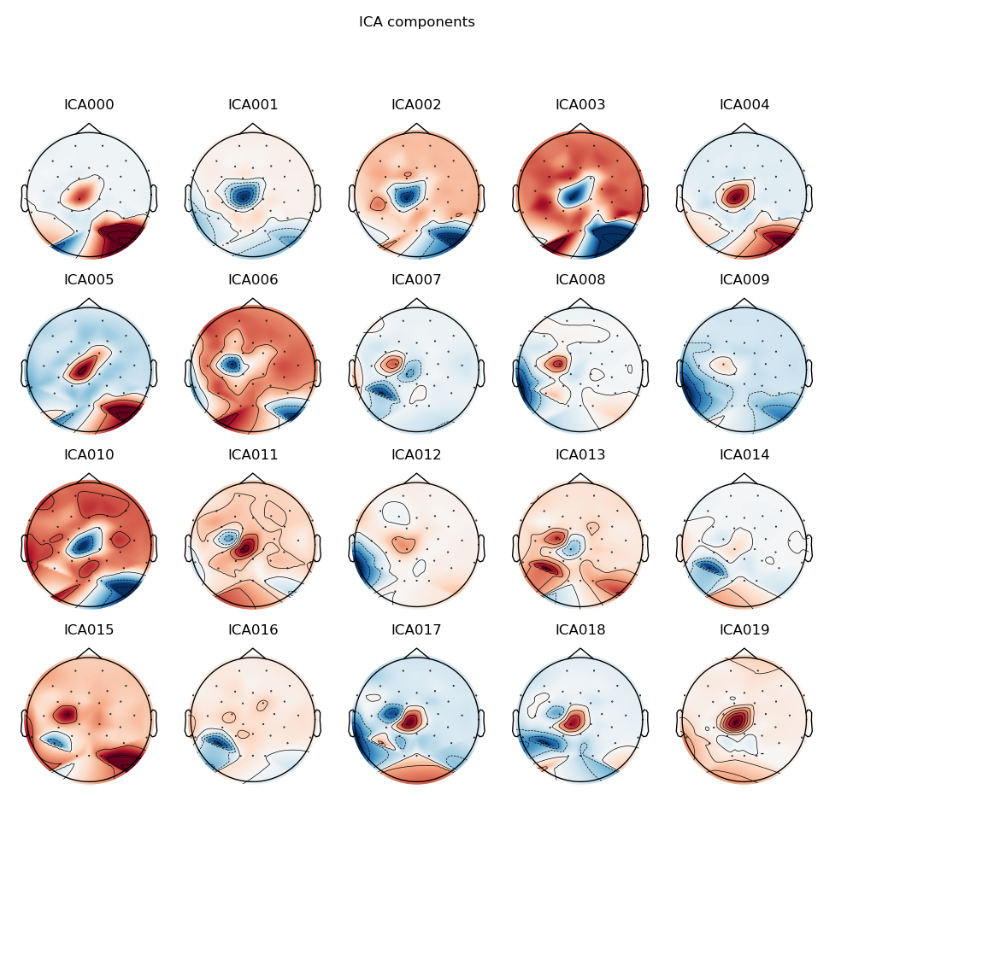

<IPython.core.display.Javascript object>


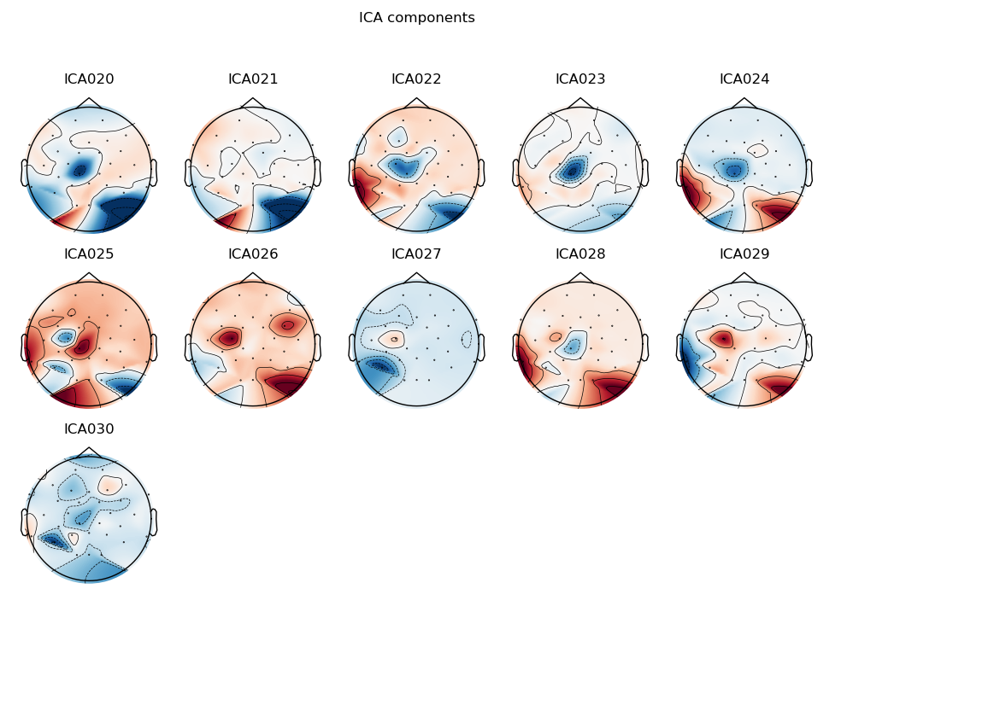

In [11]:
ba_ica.plot_components()
plt.show()

Transforming to ICA space (31 components)
Zeroing out 6 ICA components


<IPython.core.display.Javascript object>


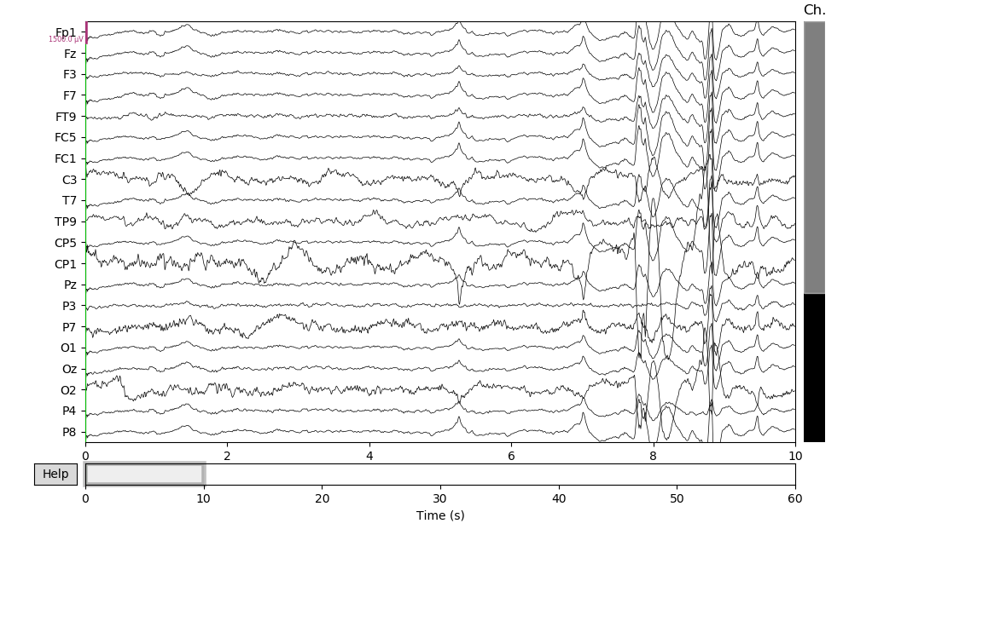

In [12]:
ba_ica.exclude = [0,1,7,19,20,29]
ba_corrected = ba_filt.copy()
ba_ica.apply(ba_corrected)
ba_corrected.plot(scalings={"eeg": 75e-5},title='After ICA (Basal Activity)', verbose=verbose)
plt.show()

Spot 1

Fitting ICA to data using 31 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting all PCA components: 31 components
Fitting ICA took 9.4s.


<IPython.core.display.Javascript object>


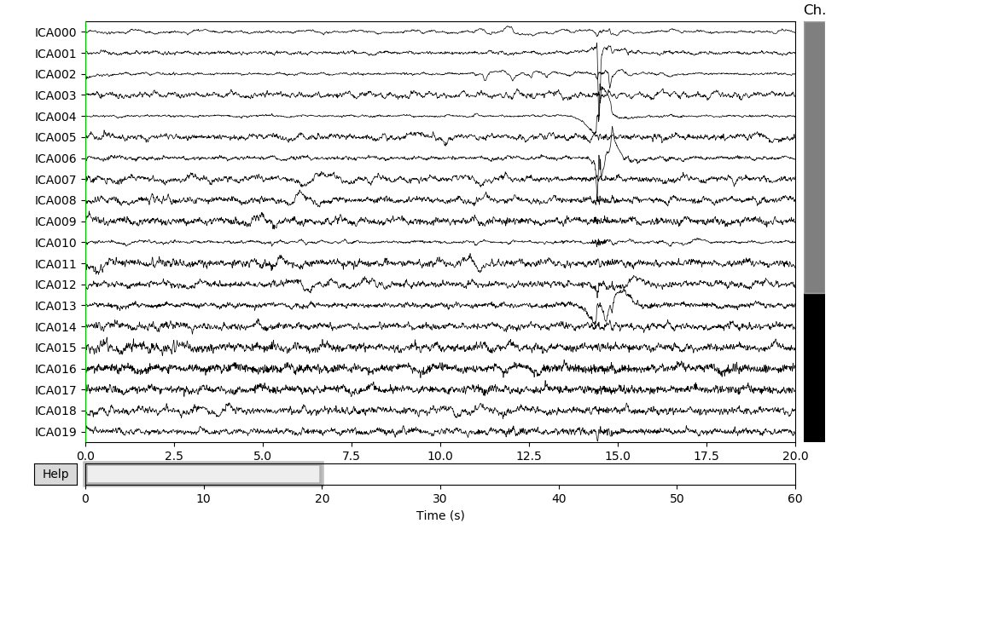

In [13]:
sp1_ica = mne.preprocessing.ICA(method='picard', random_state=1, verbose=True).fit(sp1_filt)
sp1_ica.plot_sources(sp1_filt)
plt.show()

<IPython.core.display.Javascript object>


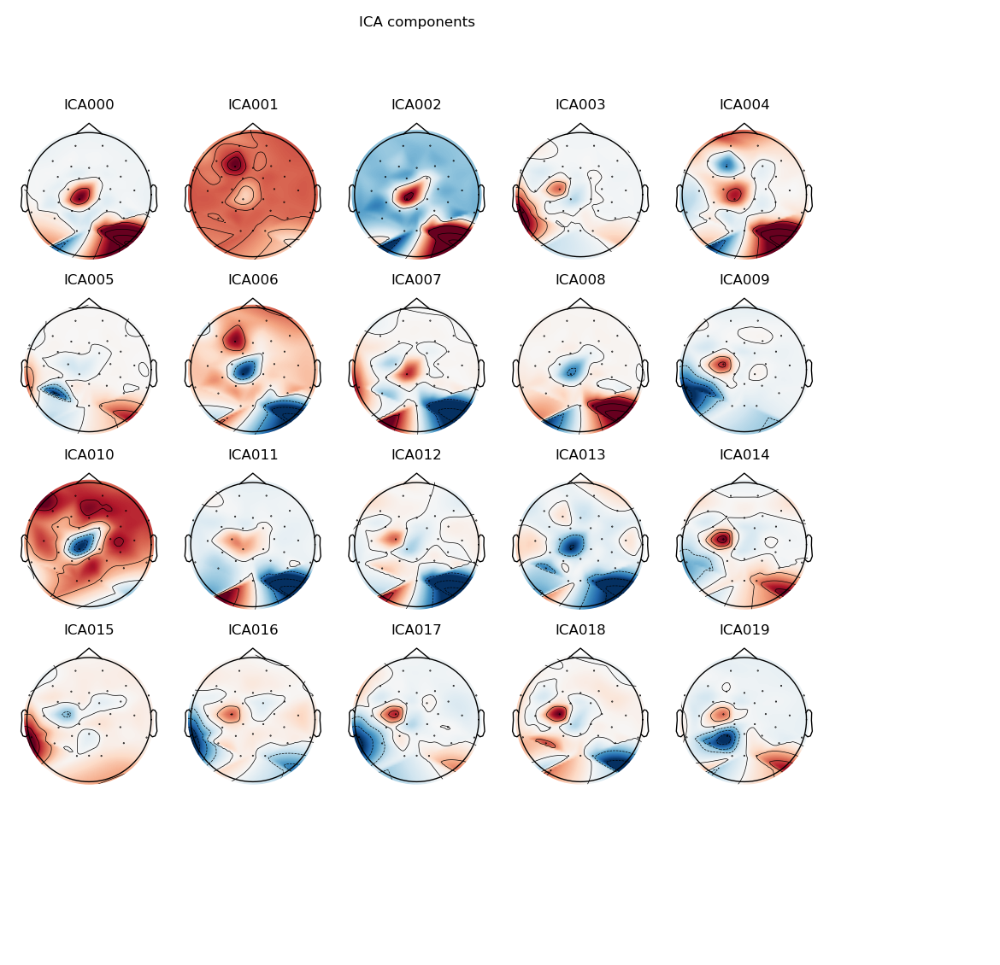

<IPython.core.display.Javascript object>


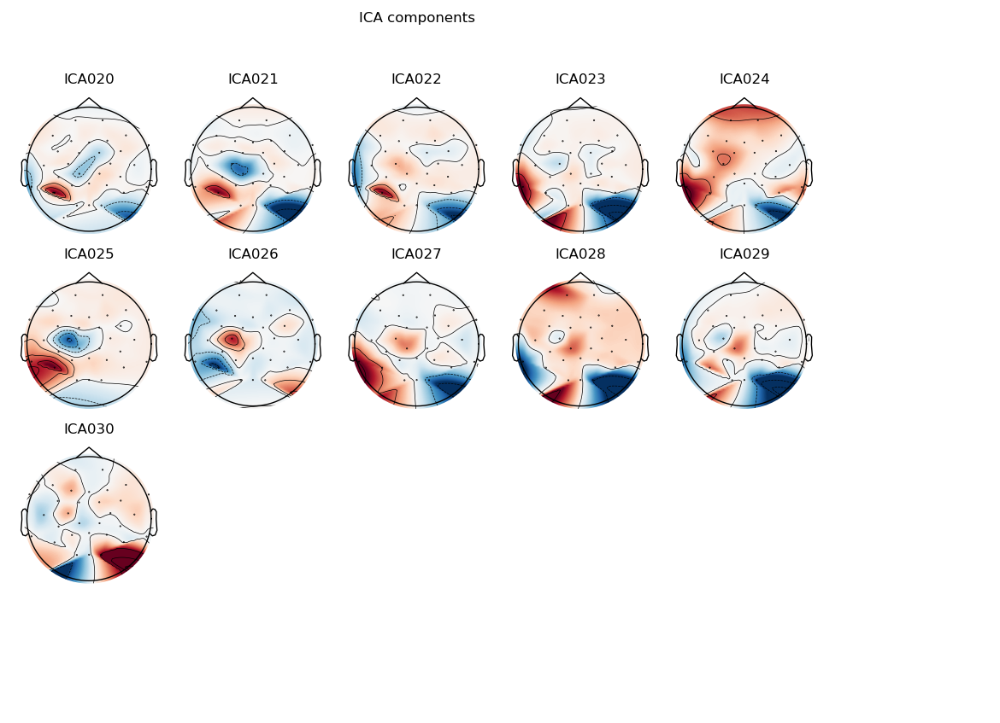

In [14]:
sp1_ica.plot_components()
plt.show()

Transforming to ICA space (31 components)
Zeroing out 11 ICA components


<IPython.core.display.Javascript object>


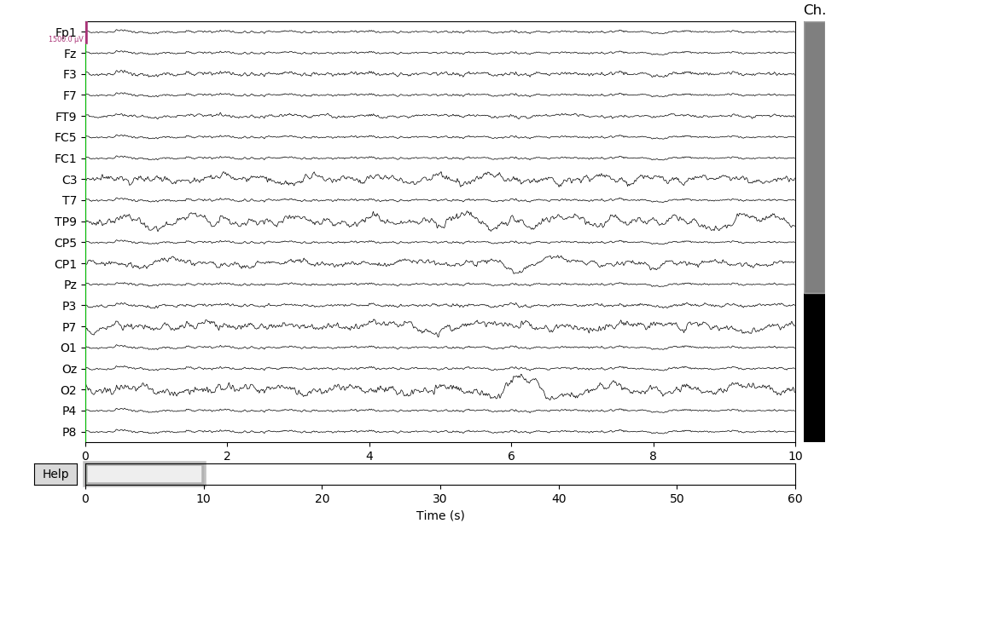

In [15]:
sp1_ica.exclude = [0,2,4,6,10,11,13,14,20,24,28]
sp1_corrected = sp1_filt.copy()
sp1_ica.apply(sp1_corrected)
sp1_corrected.plot(scalings={"eeg": 75e-5},title='After ICA (spot 1)', verbose=verbose)
plt.show()

Spot 2

Fitting ICA to data using 31 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting all PCA components: 31 components
Fitting ICA took 7.8s.


<IPython.core.display.Javascript object>


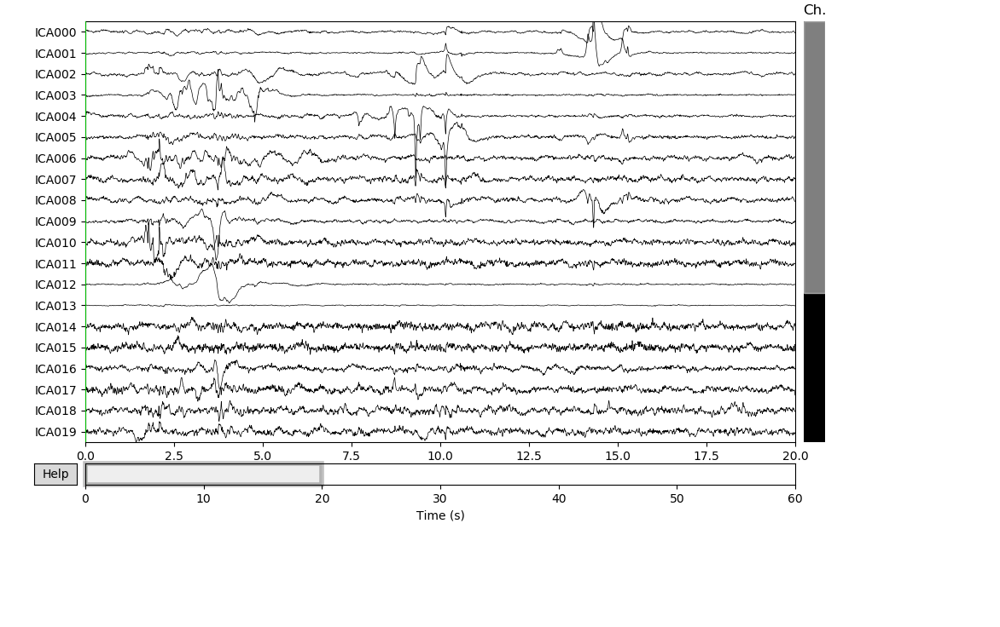

In [16]:
sp2_ica = mne.preprocessing.ICA(method='picard', random_state=1, verbose=True).fit(sp2_filt)
sp2_ica.plot_sources(sp2_filt)
plt.show()

<IPython.core.display.Javascript object>


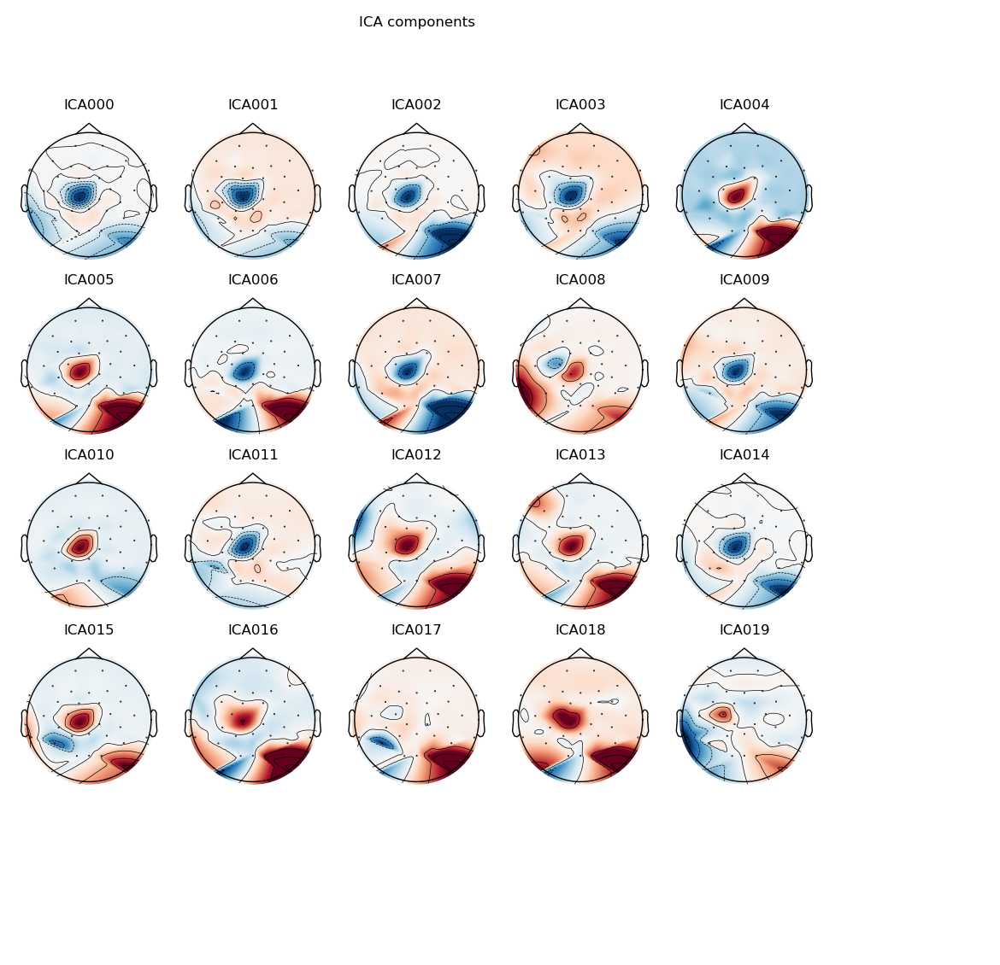

<IPython.core.display.Javascript object>


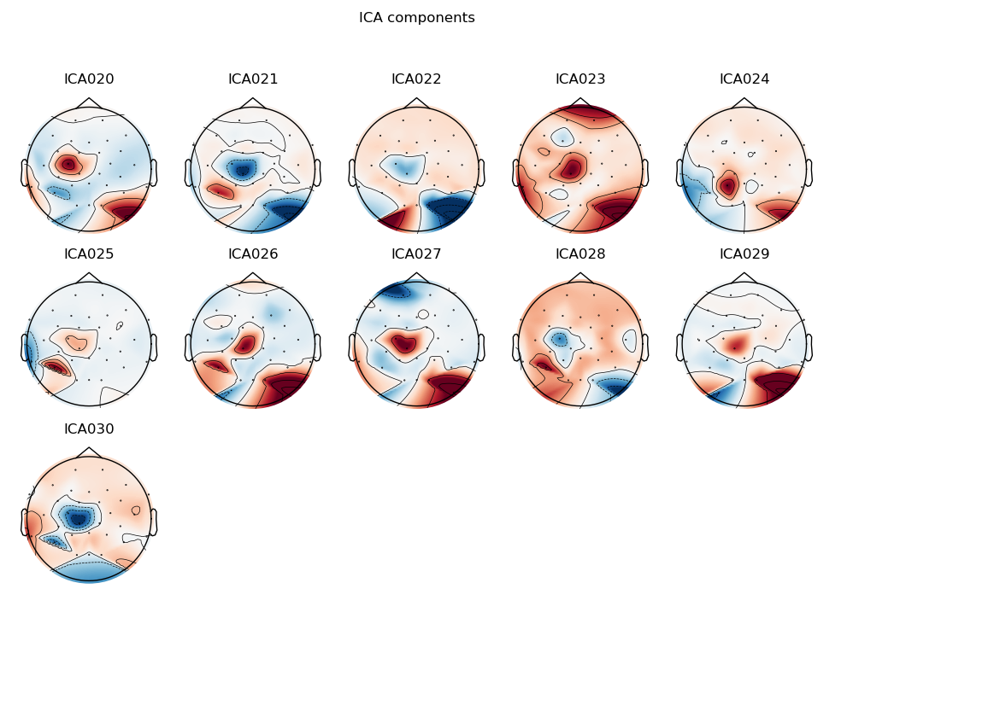

In [17]:
sp2_ica.plot_components()
plt.show()

Transforming to ICA space (31 components)
Zeroing out 2 ICA components


<IPython.core.display.Javascript object>


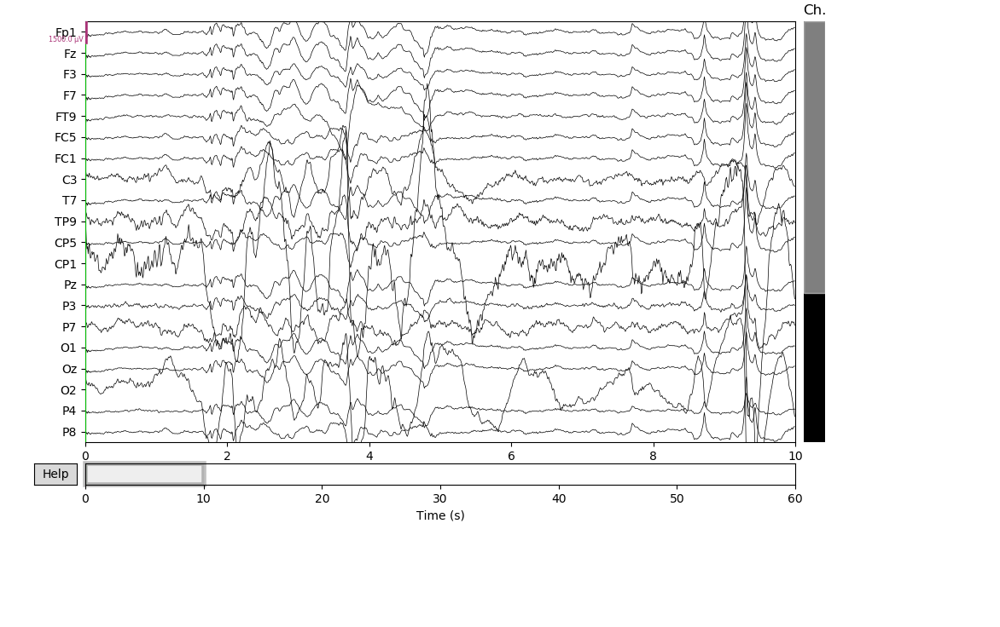

In [18]:
sp2_ica.exclude = [0,1]
sp2_corrected = sp2_filt.copy()
sp2_ica.apply(sp2_corrected)
sp2_corrected.plot(scalings={"eeg": 75e-5},title='After ICA (spot 2)', verbose=verbose)
plt.show()

Spot 3

Fitting ICA to data using 31 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting all PCA components: 31 components
Fitting ICA took 12.1s.


<IPython.core.display.Javascript object>


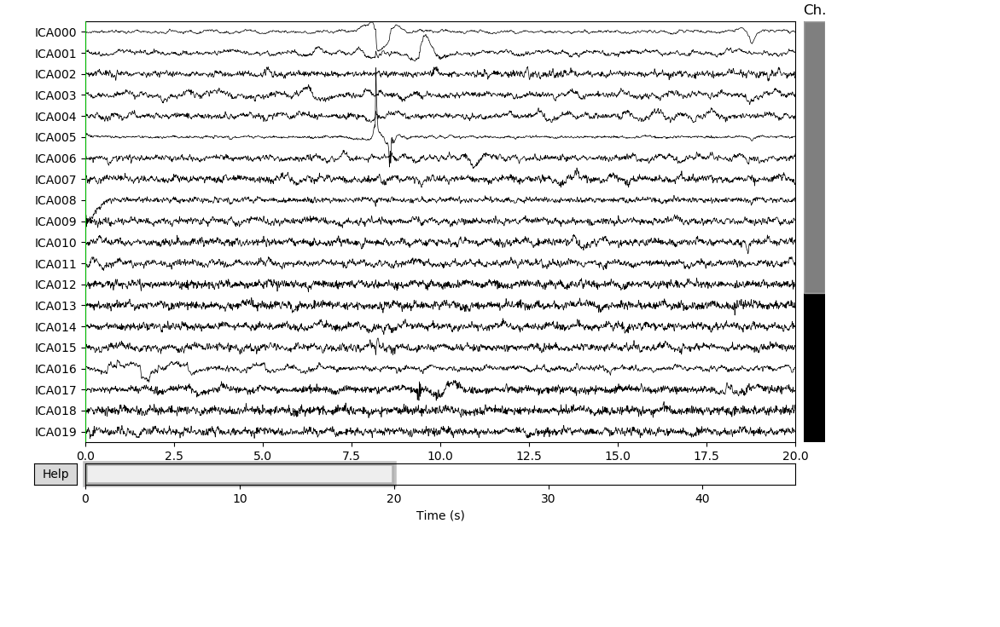

In [19]:
sp3_ica = mne.preprocessing.ICA(method='picard', random_state=1, verbose=True).fit(sp3_filt)
sp3_ica.plot_sources(sp3_filt)
plt.show()

<IPython.core.display.Javascript object>


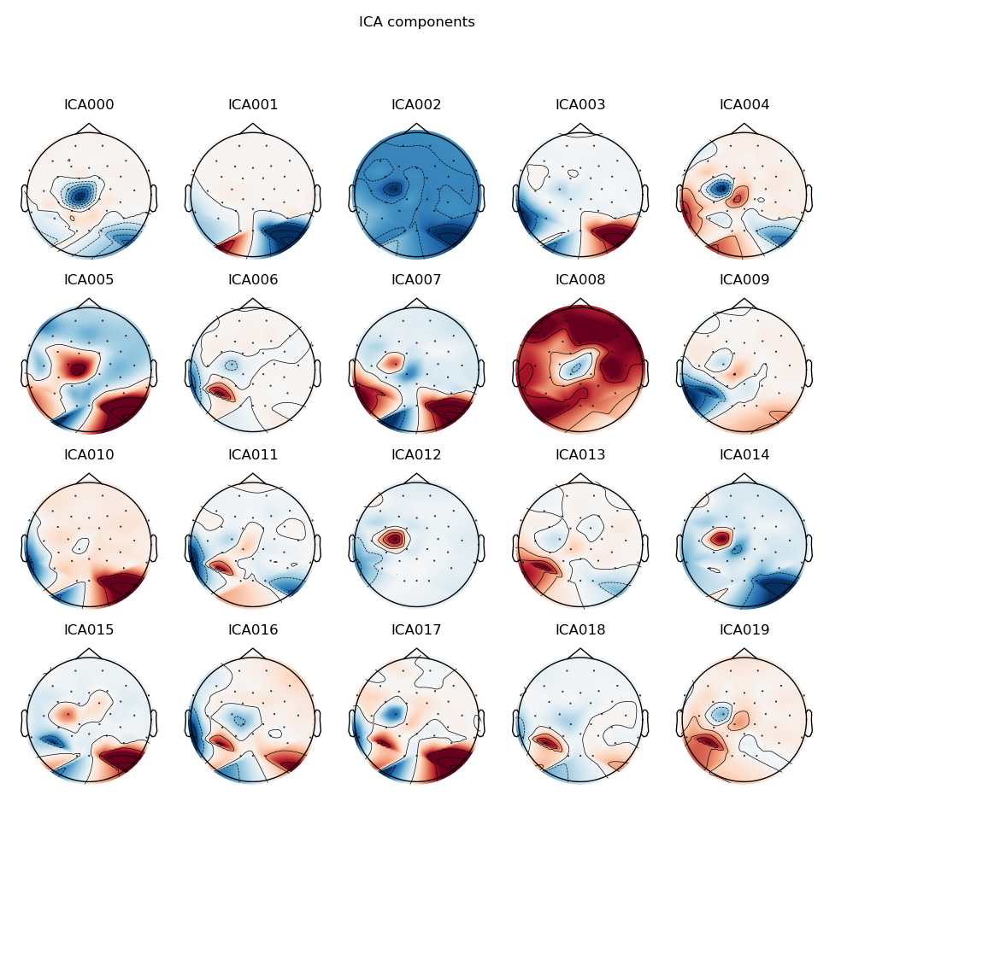

<IPython.core.display.Javascript object>


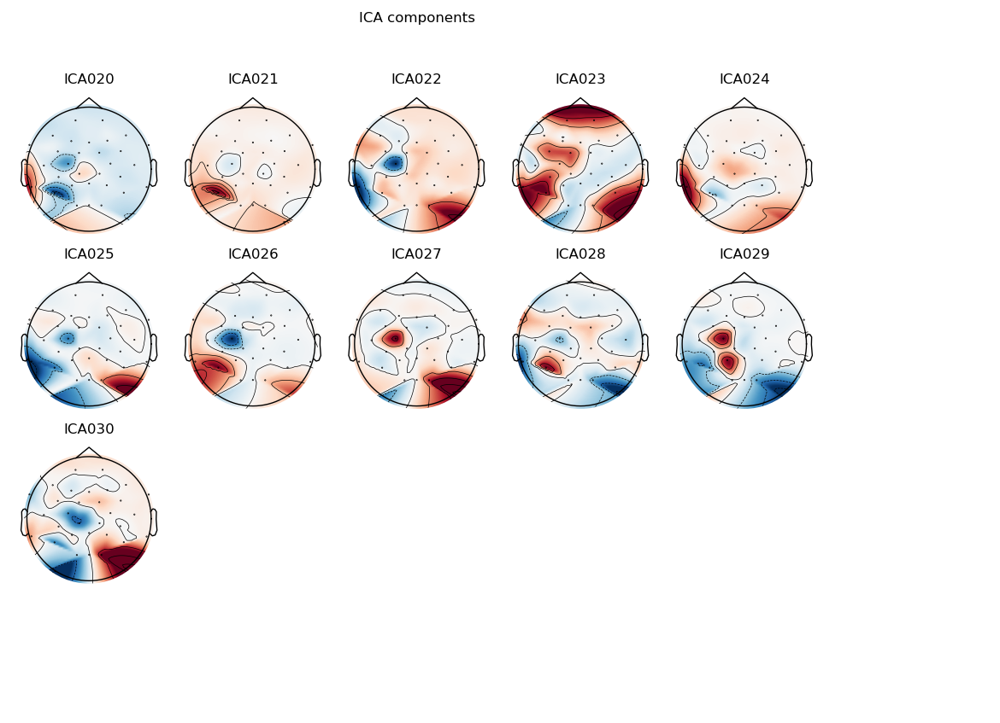

In [20]:
sp3_ica.plot_components()
plt.show()

Transforming to ICA space (31 components)
Zeroing out 2 ICA components


<IPython.core.display.Javascript object>


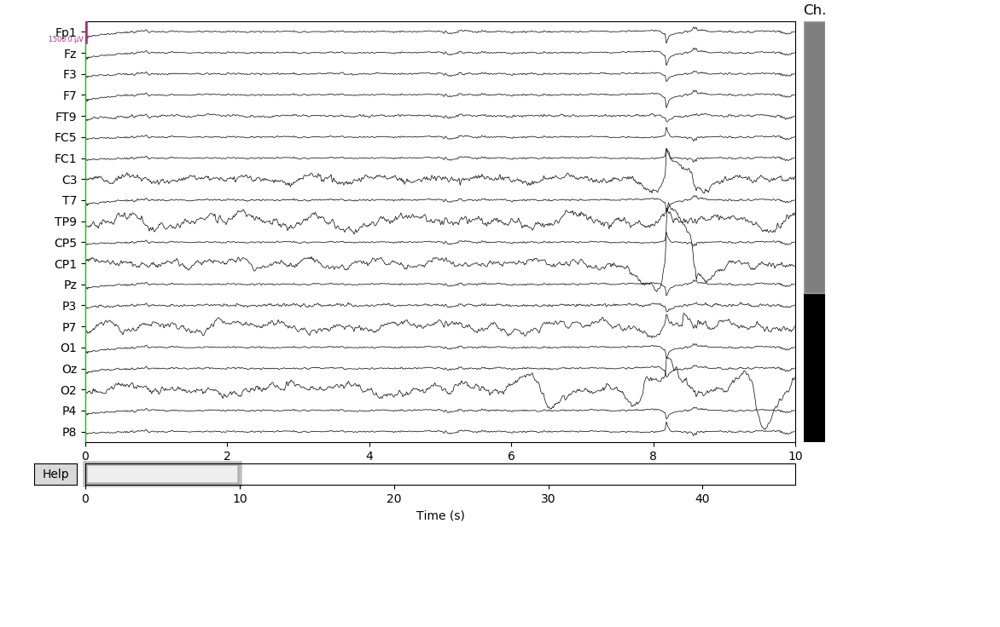

In [21]:
sp3_ica.exclude = [4,7]
sp3_corrected = sp3_filt.copy()
sp3_ica.apply(sp3_corrected)
sp3_corrected.plot(scalings={"eeg": 75e-5},title='After ICA (spot 3)', verbose=verbose)
plt.show()

Spot 4

Fitting ICA to data using 31 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting all PCA components: 31 components
Fitting ICA took 10.6s.


<IPython.core.display.Javascript object>


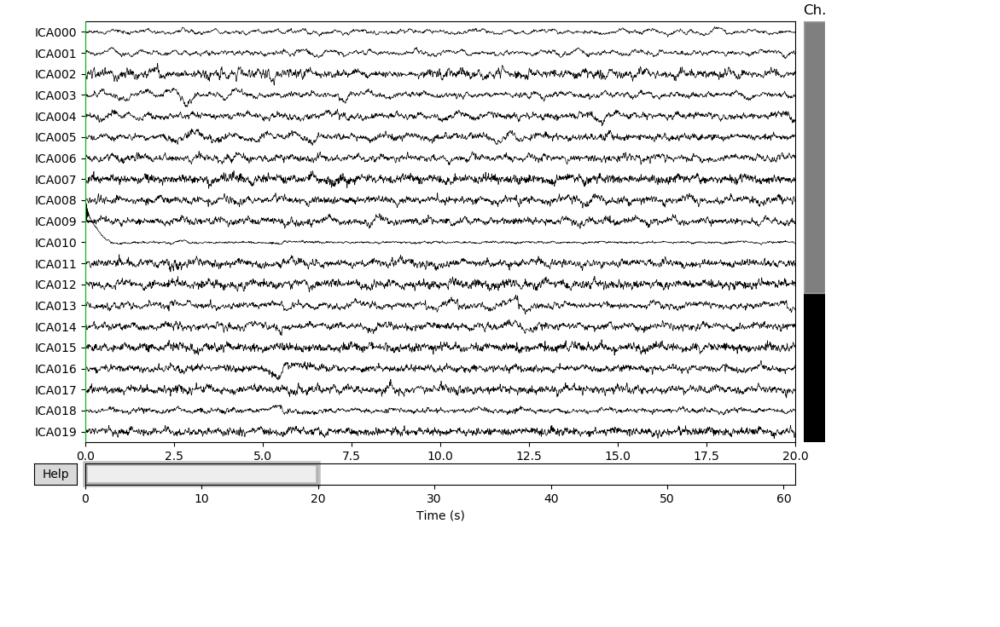

In [22]:
sp4_ica = mne.preprocessing.ICA(method='picard', random_state=1, verbose=True).fit(sp4_filt)
sp4_ica.plot_sources(sp4_filt)
plt.show()

<IPython.core.display.Javascript object>


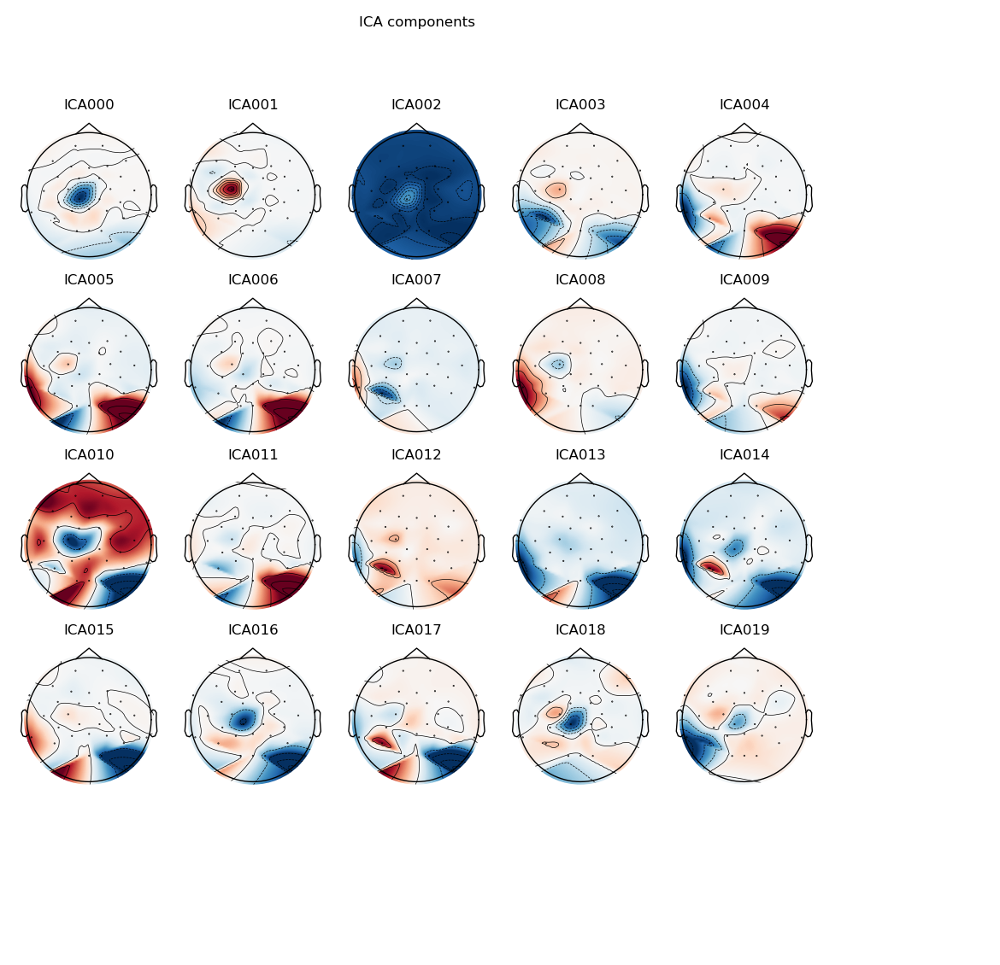

c:\users\noemi\appdata\local\programs\python\python37\lib\site-packages\mne\viz\utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


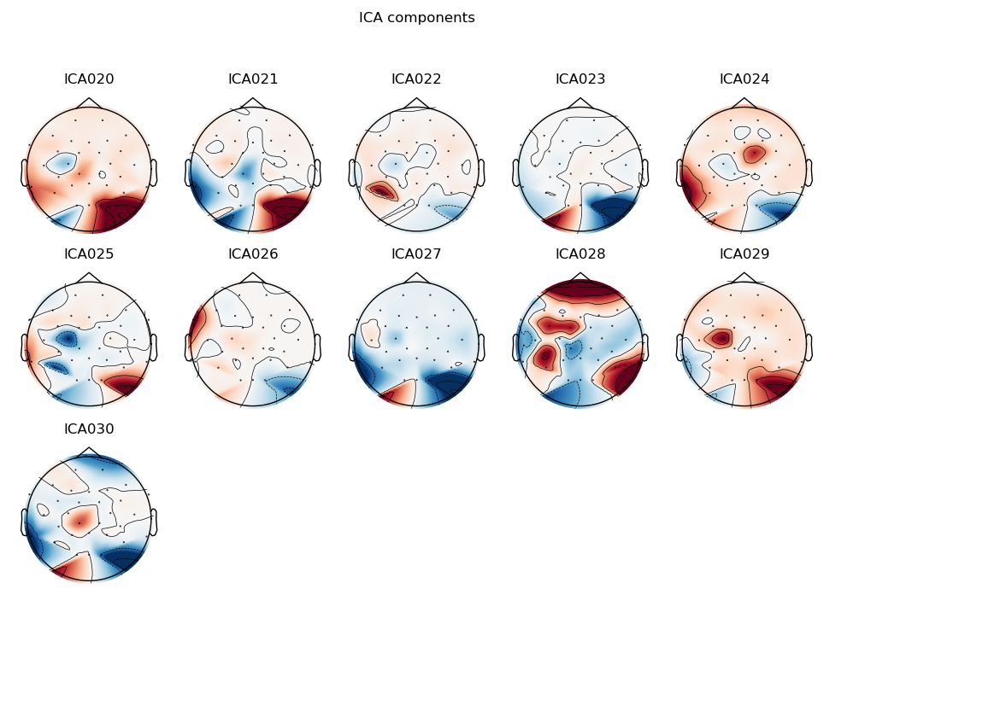

In [23]:
sp4_ica.plot_components()
plt.show()

Transforming to ICA space (31 components)
Zeroing out 2 ICA components


c:\users\noemi\appdata\local\programs\python\python37\lib\site-packages\mne\viz\utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


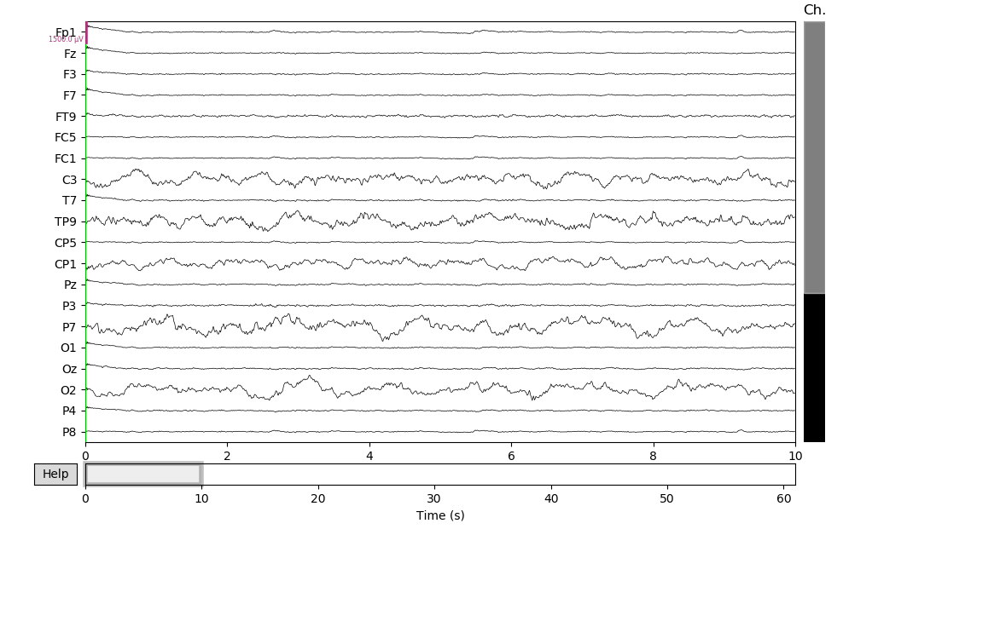

In [24]:
sp4_ica.exclude = [2,8]
sp4_corrected = sp4_filt.copy()
sp4_ica.apply(sp4_corrected)
sp4_corrected.plot(scalings={"eeg": 75e-5},title='After ICA (spot 4)', verbose=verbose)
plt.show()

Spot 5

Fitting ICA to data using 31 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting all PCA components: 31 components
Fitting ICA took 8.9s.


<IPython.core.display.Javascript object>


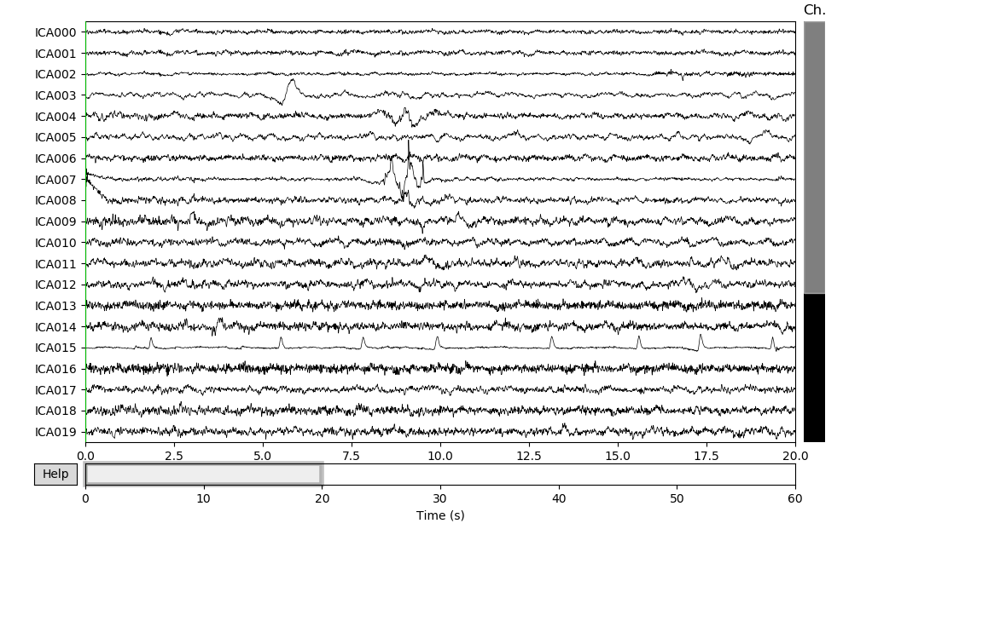

In [25]:
sp5_ica = mne.preprocessing.ICA(method='picard', random_state=1, verbose=True).fit(sp5_filt)
sp5_ica.plot_sources(sp5_filt)
plt.show()

<IPython.core.display.Javascript object>


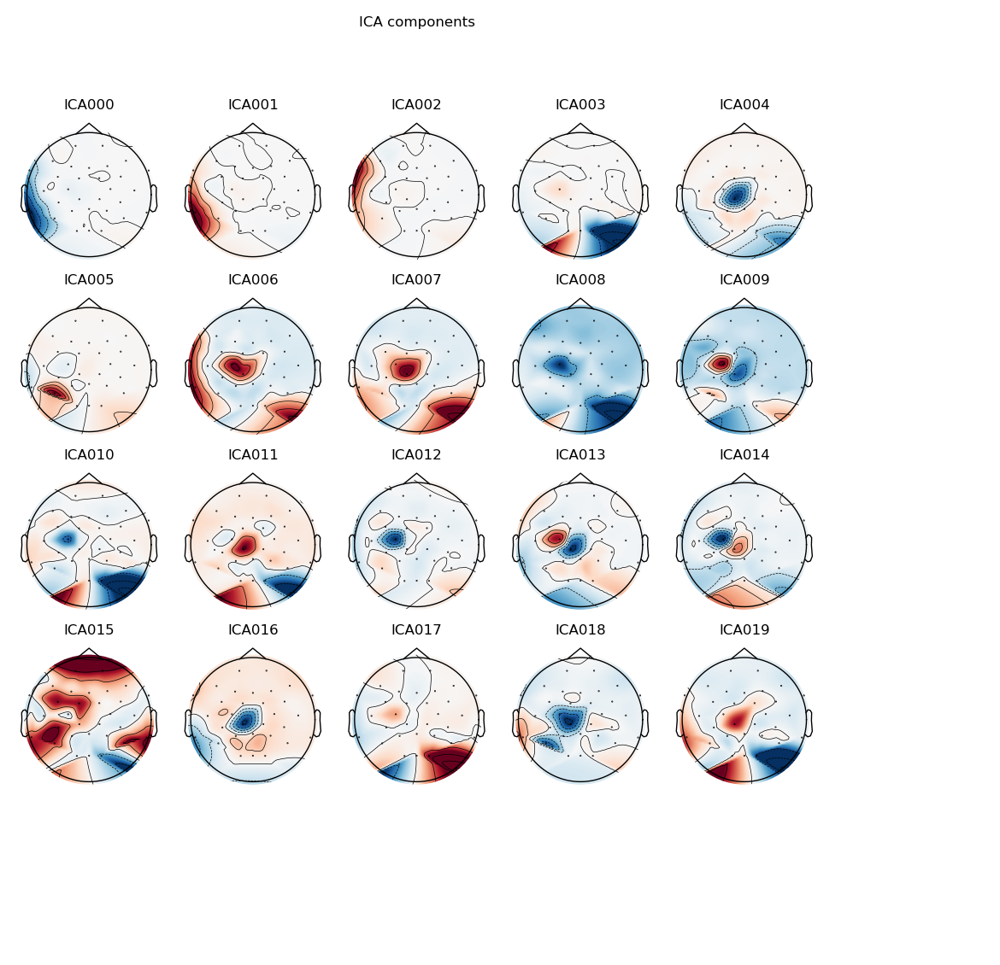

c:\users\noemi\appdata\local\programs\python\python37\lib\site-packages\mne\viz\utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


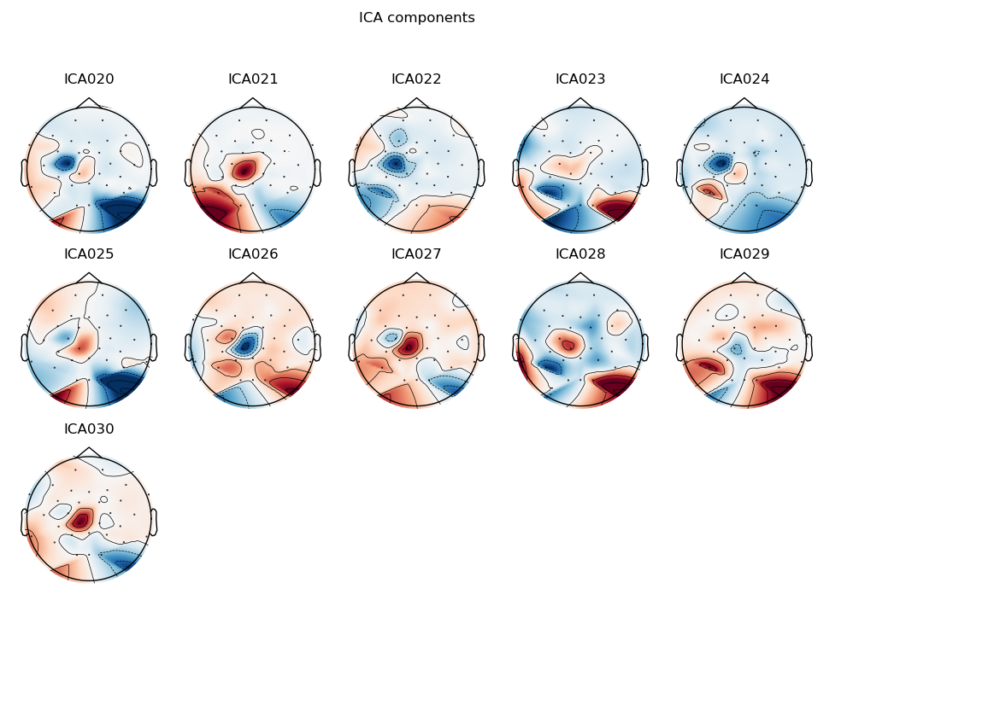

In [26]:
sp5_ica.plot_components()
plt.show()

Transforming to ICA space (31 components)
Zeroing out 1 ICA component


c:\users\noemi\appdata\local\programs\python\python37\lib\site-packages\mne\viz\utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


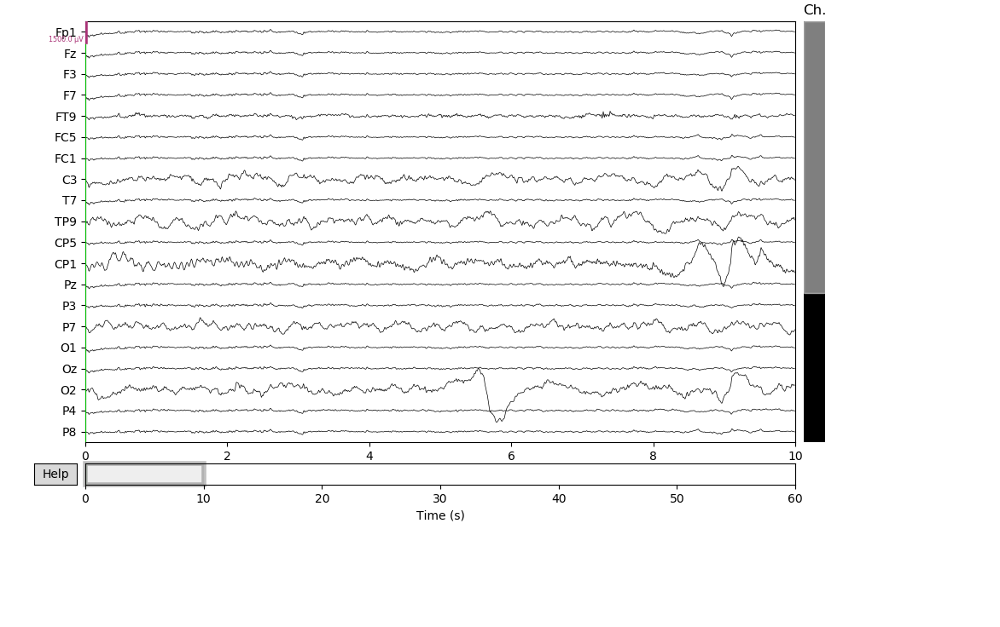

In [27]:
sp5_ica.exclude = [15]
sp5_corrected = sp5_filt.copy()
sp5_ica.apply(sp5_corrected)
sp5_corrected.plot(scalings={"eeg": 75e-5},title='After ICA (spot 5)', verbose=verbose)
plt.show()

Spot 6

Fitting ICA to data using 31 channels (please be patient, this may take a while)
Inferring max_pca_components from picks
Selecting all PCA components: 31 components
Fitting ICA took 13.0s.


<IPython.core.display.Javascript object>


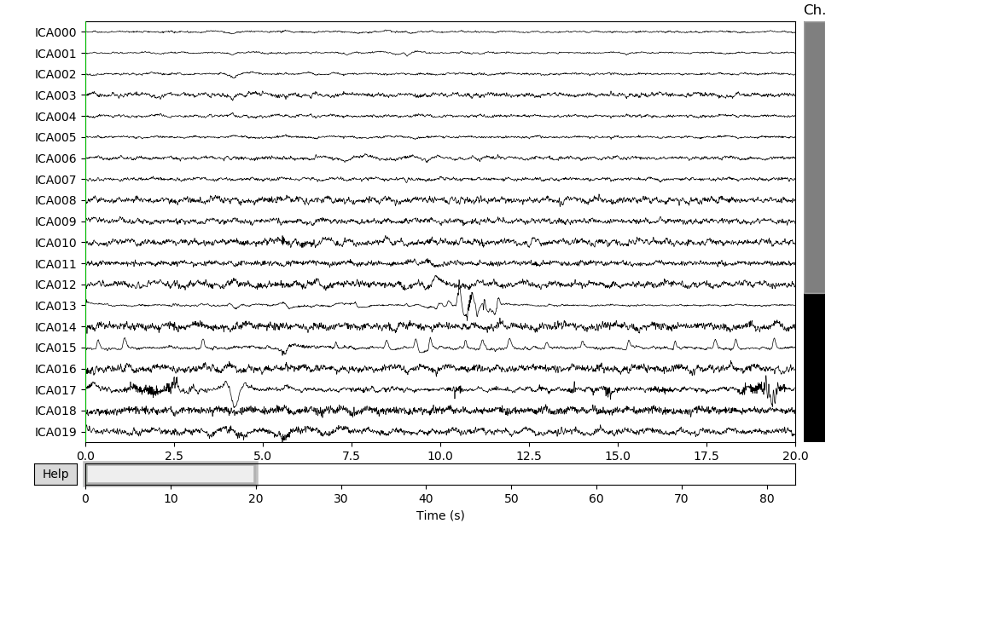

In [28]:
sp6_ica = mne.preprocessing.ICA(method='picard', random_state=1, verbose=True).fit(sp6_filt)
sp6_ica.plot_sources(sp6_filt)
plt.show()

<IPython.core.display.Javascript object>


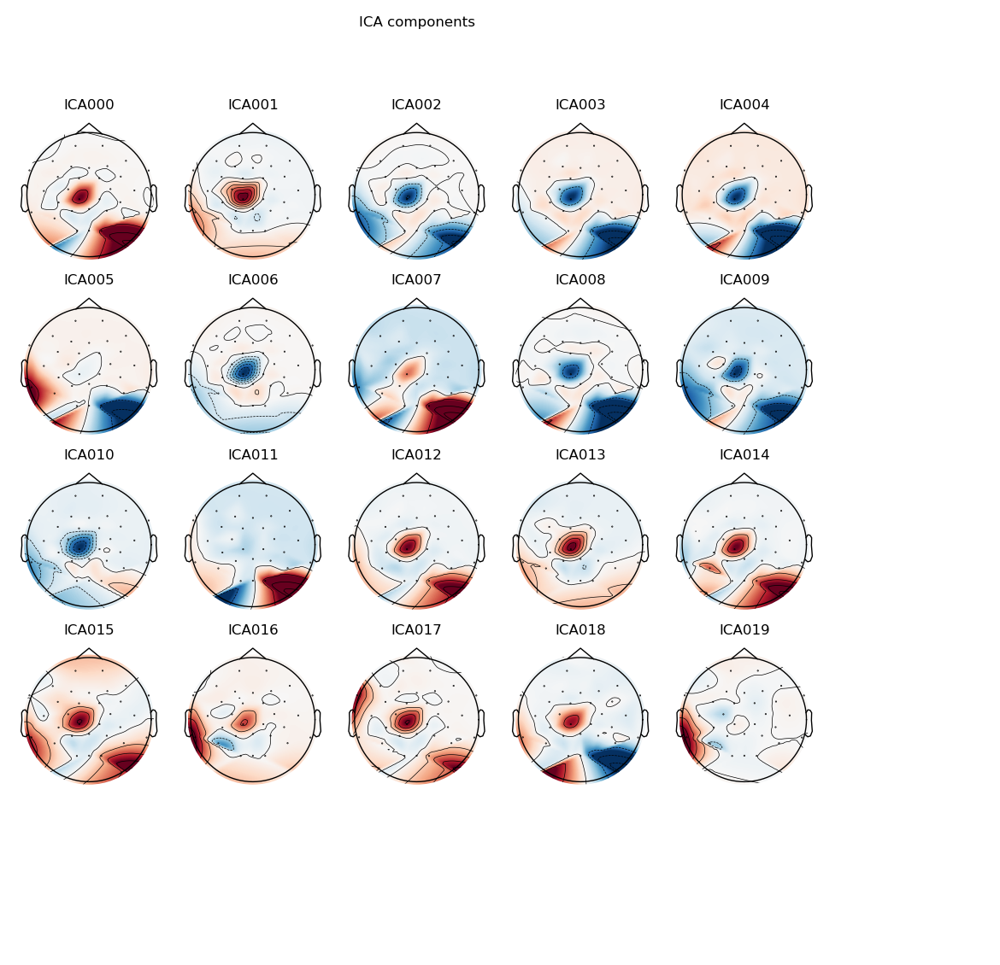

c:\users\noemi\appdata\local\programs\python\python37\lib\site-packages\mne\viz\utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


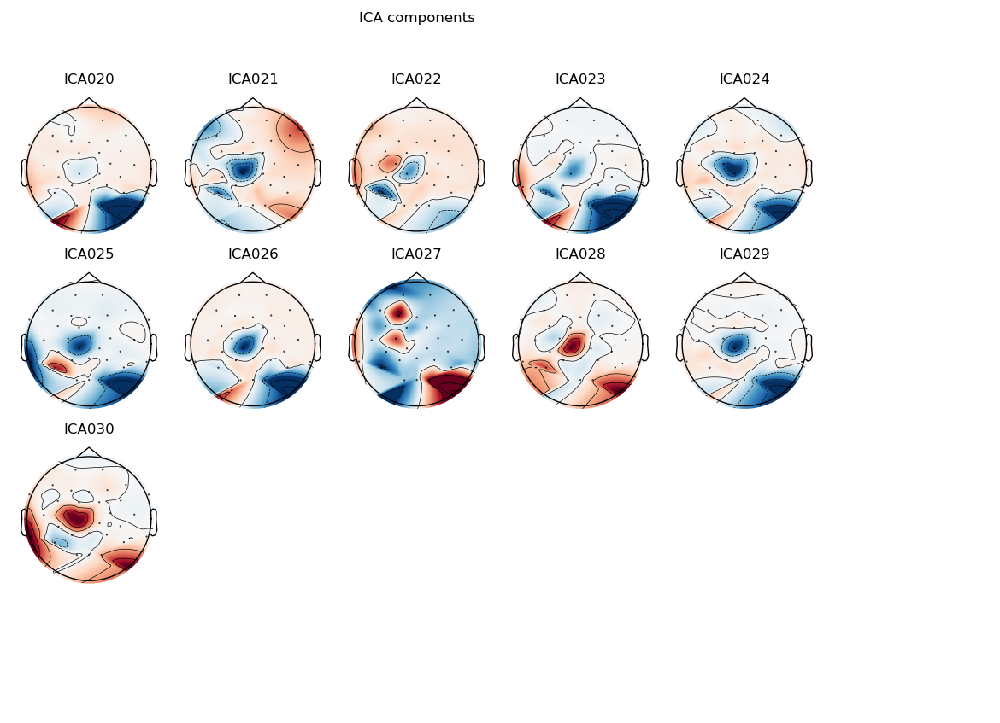

In [29]:
sp6_ica.plot_components()
plt.show()

Transforming to ICA space (31 components)
Zeroing out 1 ICA component


c:\users\noemi\appdata\local\programs\python\python37\lib\site-packages\mne\viz\utils.py:781: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(*args, **kwargs)


<IPython.core.display.Javascript object>


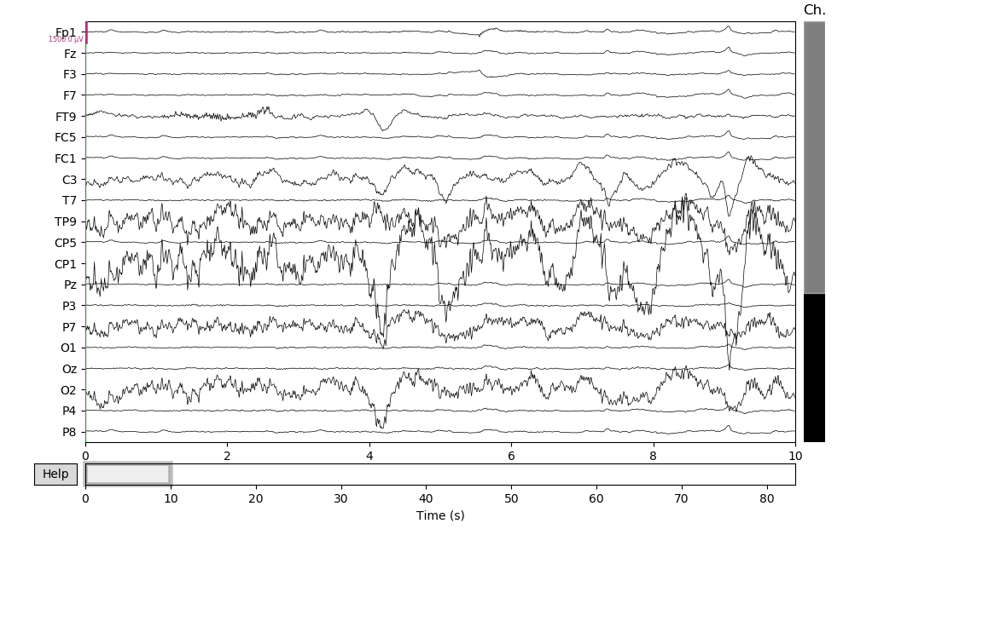

In [30]:
sp6_ica.exclude = [2]
sp6_corrected = sp6_filt.copy()
sp6_ica.apply(sp6_corrected)
sp6_corrected.plot(scalings={"eeg": 75e-5},title='After ICA (spot 6)', verbose=verbose)
plt.show()

# Separar 4 canales:

In [31]:
picks=[2,3,28,29] # Channels of interest [F3, F7, F4, F8]
ch_include=['F3', 'F7', 'F4', 'F8']
ch_exclude=['Fp1','Fz','FT9','FC5','FC1','C3','T7','TP9','CP5','CP1','Pz','P3','P7','O1','Oz','O2','P4','P8','TP10','CP6','CP2','C4','T8','FT10','FC6','FC2','Fp2']
info_ch=mne.create_info(ch_include, fs, ch_types='eeg', verbose=verbose) # use raw.set_montage('standard_1020')

In [32]:
ba_clean =  ba_corrected.drop_channels(ch_exclude)
sp1_clean= sp1_corrected.drop_channels(ch_exclude)
sp2_clean= sp2_corrected.drop_channels(ch_exclude)
sp3_clean= sp3_corrected.drop_channels(ch_exclude)
sp4_clean= sp4_corrected.drop_channels(ch_exclude)
sp5_clean= sp5_corrected.drop_channels(ch_exclude)
sp6_clean= sp6_corrected.drop_channels(ch_exclude)

# FRECUENCY BANDS

In [33]:
#ba
pot_alpha_F3_ba,pot_total_F3_ba, ratio_F3_ba = get_potencias(0,ba_clean,fs)
pot_alpha_F7_ba,pot_total_F7_ba, ratio_F7_ba = get_potencias(1,ba_clean,fs)
pot_alpha_F4_ba,pot_total_F4_ba, ratio_F4_ba = get_potencias(2,ba_clean,fs)
pot_alpha_F8_ba,pot_total_F8_ba, ratio_F8_ba = get_potencias(3,ba_clean,fs)
#sp1
pot_alpha_F3_sp1,pot_total_F3_sp1, ratio_F3_sp1 = get_potencias(0,sp1_clean,fs)
pot_alpha_F7_sp1,pot_total_F7_sp1, ratio_F7_sp1 = get_potencias(1,sp1_clean,fs)
pot_alpha_F4_sp1,pot_total_F4_sp1, ratio_F4_sp1 = get_potencias(2,sp1_clean,fs)
pot_alpha_F8_sp1,pot_total_F8_sp1, ratio_F8_sp1 = get_potencias(3,sp1_clean,fs)
#sp2
pot_alpha_F3_sp2,pot_total_F3_sp2, ratio_F3_sp2 = get_potencias(0,sp2_clean,fs)
pot_alpha_F7_sp2,pot_total_F7_sp2, ratio_F7_sp2 = get_potencias(1,sp2_clean,fs)
pot_alpha_F4_sp2,pot_total_F4_sp2, ratio_F4_sp2 = get_potencias(2,sp2_clean,fs)
pot_alpha_F8_sp2,pot_total_F8_sp2, ratio_F8_sp2 = get_potencias(3,sp2_clean,fs)
#sp3
pot_alpha_F3_sp3,pot_total_F3_sp3, ratio_F3_sp3 = get_potencias(0,sp3_clean,fs)
pot_alpha_F7_sp3,pot_total_F7_sp3, ratio_F7_sp3 = get_potencias(1,sp3_clean,fs)
pot_alpha_F4_sp3,pot_total_F4_sp3, ratio_F4_sp3 = get_potencias(2,sp3_clean,fs)
pot_alpha_F8_sp3,pot_total_F8_sp3, ratio_F8_sp3 = get_potencias(3,sp3_clean,fs)
#sp4
pot_alpha_F3_sp4,pot_total_F3_sp4, ratio_F3_sp4 = get_potencias(0,sp4_clean,fs)
pot_alpha_F7_sp4,pot_total_F7_sp4, ratio_F7_sp4 = get_potencias(1,sp4_clean,fs)
pot_alpha_F4_sp4,pot_total_F4_sp4, ratio_F4_sp4 = get_potencias(2,sp4_clean,fs)
pot_alpha_F8_sp4,pot_total_F8_sp4, ratio_F8_sp4 = get_potencias(3,sp4_clean,fs)
#sp5
pot_alpha_F3_sp5,pot_total_F3_sp5, ratio_F3_sp5 = get_potencias(0,sp5_clean,fs)
pot_alpha_F7_sp5,pot_total_F7_sp5, ratio_F7_sp5 = get_potencias(1,sp5_clean,fs)
pot_alpha_F4_sp5,pot_total_F4_sp5, ratio_F4_sp5 = get_potencias(2,sp5_clean,fs)
pot_alpha_F8_sp5,pot_total_F8_sp5, ratio_F8_sp5 = get_potencias(3,sp5_clean,fs)
#sp6
pot_alpha_F3_sp6,pot_total_F3_sp6, ratio_F3_sp6 = get_potencias(0,sp6_clean,fs)
pot_alpha_F7_sp6,pot_total_F7_sp6, ratio_F7_sp6 = get_potencias(1,sp6_clean,fs)
pot_alpha_F4_sp6,pot_total_F4_sp6, ratio_F4_sp6 = get_potencias(2,sp6_clean,fs)
pot_alpha_F8_sp6,pot_total_F8_sp6, ratio_F8_sp6 = get_potencias(3,sp6_clean,fs)

# GFPa y AWI

### GFPa

In [34]:
GFPa_right_ba = (pot_total_F3_ba+pot_total_F7_ba)/2
GFPa_left_ba = (pot_total_F4_ba+pot_total_F8_ba)/2

GFPa_right_sp1 = (pot_total_F3_sp1+pot_total_F7_sp1)/2
GFPa_left_sp1 = (pot_total_F4_sp1+pot_total_F8_sp1)/2

GFPa_right_sp2 = (pot_total_F3_sp2+pot_total_F7_sp2)/2
GFPa_left_sp2 = (pot_total_F4_sp2+pot_total_F8_sp2)/2

GFPa_right_sp3 = (pot_total_F3_sp3+pot_total_F7_sp3)/2
GFPa_left_sp3 = (pot_total_F4_sp3+pot_total_F8_sp3)/2

GFPa_right_sp4 = (pot_total_F3_sp4+pot_total_F7_sp4)/2
GFPa_left_sp4 = (pot_total_F4_sp4+pot_total_F8_sp4)/2

GFPa_right_sp5 = (pot_total_F3_sp5+pot_total_F7_sp5)/2
GFPa_left_sp5 = (pot_total_F4_sp5+pot_total_F8_sp5)/2

GFPa_right_sp6 = (pot_total_F3_sp6+pot_total_F7_sp6)/2
GFPa_left_sp6 = (pot_total_F4_sp6+pot_total_F8_sp6)/2

### AWI

In [35]:
AW_ba  = GFPa_right_ba  - GFPa_left_ba
AW_sp1 = GFPa_right_sp1 - GFPa_left_sp1
AW_sp2 = GFPa_right_sp2 - GFPa_left_sp2
AW_sp3 = GFPa_right_sp3 - GFPa_left_sp3
AW_sp4 = GFPa_right_sp4 - GFPa_left_sp4
AW_sp5 = GFPa_right_sp5 - GFPa_left_sp5
AW_sp6 = GFPa_right_sp6 - GFPa_left_sp6

## TABLA DE INDICES

In [46]:
#row=[subject,AW_ba,AW_sp1,AW_sp2,AW_sp3,AW_sp4,AW_sp5,AW_sp6]
row=str(subject)+','+str(AW_ba)+','+str(AW_sp1)+','+str(AW_sp2)+','+str(AW_sp3)+','+str(AW_sp4)+','+str(AW_sp5)+','+str(AW_sp6)
file = open('AWI.csv','r+')
lines=file.readlines()
sb=[]
for line in lines:
    sb.append(line[0:4])
if row[0:4] in sb:
    file.close()
else:
    file.write(row)
    file.write('\n')  
file.close()

col=['Subject','AWI ba', 'AWI sp1', 'AWI sp2', 'AWI sp3', 'AWI sp4', 'AWI sp5', 'AWI sp6']
df=pd.read_csv('AWI.csv', names= col)#header=0 para que no se repitan los nombres de los atributos
df

,Subject,AWI ba,AWI sp1,AWI sp2,AWI sp3,AWI sp4,AWI sp5,AWI sp6
0,6401,6.667418e-05,4.911904e-06,-4.834768e-08,1.834422e-05,1.648663e-05,8.889640e-05,0.000018
1,2900,-3.275464e-07,6.551040e-07,-2.889297e-07,-2.284409e-08,-1.092479e-08,-7.657841e-09,-0.000001
